# Retail Store Data- Exploratory Data Analysis
***
### _Sayali Bachhav_

##### Problem Statement:
As a business manager, finding out weak areas where you can work to make more profit

In [1]:
# Importing libraries
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
%matplotlib inline

import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

import seaborn as sns

import gc

In [2]:
#Importing Data
store = pd.read_csv('SampleSuperstore.csv')
store.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9994 entries, 0 to 9993
Data columns (total 13 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Ship Mode     9994 non-null   object 
 1   Segment       9994 non-null   object 
 2   Country       9994 non-null   object 
 3   City          9994 non-null   object 
 4   State         9994 non-null   object 
 5   Postal Code   9994 non-null   int64  
 6   Region        9994 non-null   object 
 7   Category      9994 non-null   object 
 8   Sub-Category  9994 non-null   object 
 9   Sales         9994 non-null   float64
 10  Quantity      9994 non-null   int64  
 11  Discount      9994 non-null   float64
 12  Profit        9994 non-null   float64
dtypes: float64(3), int64(2), object(8)
memory usage: 1015.1+ KB


In [3]:
# Checking for data columns and dtypes and if any null values
store.head()

,Ship Mode,Segment,Country,City,State,Postal Code,Region,Category,Sub-Category,Sales,Quantity,Discount,Profit
0,Second Class,Consumer,United States,Henderson,Kentucky,42420,South,Furniture,Bookcases,261.9600,2,0.00,41.9136
1,Second Class,Consumer,United States,Henderson,Kentucky,42420,South,Furniture,Chairs,731.9400,3,0.00,219.5820
2,Second Class,Corporate,United States,Los Angeles,California,90036,West,Office Supplies,Labels,14.6200,2,0.00,6.8714
3,Standard Class,Consumer,United States,Fort Lauderdale,Florida,33311,South,Furniture,Tables,957.5775,5,0.45,-383.0310
4,Standard Class,Consumer,United States,Fort Lauderdale,Florida,33311,South,Office Supplies,Storage,22.3680,2,0.20,2.5164


In [4]:
store=store.round(2)

In [5]:
store.head()

,Ship Mode,Segment,Country,City,State,Postal Code,Region,Category,Sub-Category,Sales,Quantity,Discount,Profit
0,Second Class,Consumer,United States,Henderson,Kentucky,42420,South,Furniture,Bookcases,261.96,2,0.00,41.91
1,Second Class,Consumer,United States,Henderson,Kentucky,42420,South,Furniture,Chairs,731.94,3,0.00,219.58
2,Second Class,Corporate,United States,Los Angeles,California,90036,West,Office Supplies,Labels,14.62,2,0.00,6.87
3,Standard Class,Consumer,United States,Fort Lauderdale,Florida,33311,South,Furniture,Tables,957.58,5,0.45,-383.03
4,Standard Class,Consumer,United States,Fort Lauderdale,Florida,33311,South,Office Supplies,Storage,22.37,2,0.20,2.52


In [6]:
store.isnull().values.any()

False

In [7]:
# Checking for number of unique values for all columns
store.nunique()

Ship Mode          4
Segment            3
Country            1
City             531
State             49
Postal Code      631
Region             4
Category           3
Sub-Category      17
Sales           5456
Quantity          14
Discount          12
Profit          5155
dtype: int64

## 1. Data Cleaning and Pre-processing

In [8]:
#Dropping unnecessary column - Country
store.drop(['Country'],axis=1,inplace=True)

# Restting datatype for Postal Code column
store['Postal Code']=store['Postal Code'].astype('str')

# Checking for duplicate rows
print(store.duplicated().sum())
store.drop_duplicates(inplace=True, ignore_index=True)

store.info()

17
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9977 entries, 0 to 9976
Data columns (total 12 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Ship Mode     9977 non-null   object 
 1   Segment       9977 non-null   object 
 2   City          9977 non-null   object 
 3   State         9977 non-null   object 
 4   Postal Code   9977 non-null   object 
 5   Region        9977 non-null   object 
 6   Category      9977 non-null   object 
 7   Sub-Category  9977 non-null   object 
 8   Sales         9977 non-null   float64
 9   Quantity      9977 non-null   int64  
 10  Discount      9977 non-null   float64
 11  Profit        9977 non-null   float64
dtypes: float64(3), int64(1), object(8)
memory usage: 935.5+ KB


In [9]:
# Adding state codes to data for future rendering of map
state_codes = {
    'District of Columbia' : 'dc','Mississippi': 'MS', 'Oklahoma': 'OK', 
    'Delaware': 'DE', 'Minnesota': 'MN', 'Illinois': 'IL', 'Arkansas': 'AR', 
    'New Mexico': 'NM', 'Indiana': 'IN', 'Maryland': 'MD', 'Louisiana': 'LA', 
    'Idaho': 'ID', 'Wyoming': 'WY', 'Tennessee': 'TN', 'Arizona': 'AZ', 
    'Iowa': 'IA', 'Michigan': 'MI', 'Kansas': 'KS', 'Utah': 'UT', 
    'Virginia': 'VA', 'Oregon': 'OR', 'Connecticut': 'CT', 'Montana': 'MT', 
    'California': 'CA', 'Massachusetts': 'MA', 'West Virginia': 'WV', 
    'South Carolina': 'SC', 'New Hampshire': 'NH', 'Wisconsin': 'WI',
    'Vermont': 'VT', 'Georgia': 'GA', 'North Dakota': 'ND', 
    'Pennsylvania': 'PA', 'Florida': 'FL', 'Alaska': 'AK', 'Kentucky': 'KY', 
    'Hawaii': 'HI', 'Nebraska': 'NE', 'Missouri': 'MO', 'Ohio': 'OH', 
    'Alabama': 'AL', 'Rhode Island': 'RI', 'South Dakota': 'SD', 
    'Colorado': 'CO', 'New Jersey': 'NJ', 'Washington': 'WA', 
    'North Carolina': 'NC', 'New York': 'NY', 'Texas': 'TX', 
    'Nevada': 'NV', 'Maine': 'ME'}

store['state_code'] = store['State'].apply(lambda x : state_codes[x])
store.head()
#store.info()

,Ship Mode,Segment,City,State,Postal Code,Region,Category,Sub-Category,Sales,Quantity,Discount,Profit,state_code
0,Second Class,Consumer,Henderson,Kentucky,42420,South,Furniture,Bookcases,261.96,2,0.00,41.91,KY
1,Second Class,Consumer,Henderson,Kentucky,42420,South,Furniture,Chairs,731.94,3,0.00,219.58,KY
2,Second Class,Corporate,Los Angeles,California,90036,West,Office Supplies,Labels,14.62,2,0.00,6.87,CA
3,Standard Class,Consumer,Fort Lauderdale,Florida,33311,South,Furniture,Tables,957.58,5,0.45,-383.03,FL
4,Standard Class,Consumer,Fort Lauderdale,Florida,33311,South,Office Supplies,Storage,22.37,2,0.20,2.52,FL


In [10]:
# Adding latitude and longitude data from address

addresses = store[['City','State','Postal Code']].agg(', '.join, axis=1)
addresses=addresses.drop_duplicates().reset_index(drop=True)
locations = pd.DataFrame({'Address':addresses})
locations['Address']=locations['Address']+', USA'
locations.head()

,Address
0,"Henderson, Kentucky, 42420, USA"
1,"Los Angeles, California, 90036, USA"
2,"Fort Lauderdale, Florida, 33311, USA"
3,"Los Angeles, California, 90032, USA"
4,"Concord, North Carolina, 28027, USA"


In [11]:
locations.shape

(632, 1)

In [12]:
# Getting coordinates from Nominatim
from geopy.geocoders import Nominatim    
from geopy.extra.rate_limiter import RateLimiter


geolocator = Nominatim(user_agent='myGeocoder',timeout=None)
geocode = RateLimiter(geolocator.geocode, min_delay_seconds=1)

locations['location'] = locations['Address'].apply(geocode)
locations['Coordinates'] = locations['location'].apply(lambda loc: tuple(loc.point) if loc else None)
locations.drop('location',axis=1,inplace=True)
locations.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 632 entries, 0 to 631
Data columns (total 2 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   Address      632 non-null    object
 1   Coordinates  632 non-null    object
dtypes: object(2)
memory usage: 10.0+ KB


In [13]:
locations=locations.join(pd.DataFrame(locations['Address'].str.split(', ',3).tolist(),
                    columns = ['City','State','Postal Code', 'Country']))
locations.drop(['Address','Country'], axis=1, inplace=True)

# Coordinates to separate columns of lat, long
locations[['Latitude', 'Longitude','extra']] = pd.DataFrame(locations['Coordinates'].tolist(), index=locations.index)
locations.drop(['Coordinates','extra'], axis=1, inplace=True)

# Dropping rows with any null value
locations.dropna(how='any', inplace=True)
locations.reset_index(drop=True,inplace=True)
locations.head()

,City,State,Postal Code,Latitude,Longitude
0,Henderson,Kentucky,42420,37.836751,-87.590763
1,Los Angeles,California,90036,34.053691,-118.242766
2,Fort Lauderdale,Florida,33311,26.120959,-80.169791
3,Los Angeles,California,90032,34.053691,-118.242766
4,Concord,North Carolina,28027,35.409418,-80.580005


In [14]:
df = store.merge(locations, on=['City','State','Postal Code'])
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9977 entries, 0 to 9976
Data columns (total 15 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Ship Mode     9977 non-null   object 
 1   Segment       9977 non-null   object 
 2   City          9977 non-null   object 
 3   State         9977 non-null   object 
 4   Postal Code   9977 non-null   object 
 5   Region        9977 non-null   object 
 6   Category      9977 non-null   object 
 7   Sub-Category  9977 non-null   object 
 8   Sales         9977 non-null   float64
 9   Quantity      9977 non-null   int64  
 10  Discount      9977 non-null   float64
 11  Profit        9977 non-null   float64
 12  state_code    9977 non-null   object 
 13  Latitude      9977 non-null   float64
 14  Longitude     9977 non-null   float64
dtypes: float64(5), int64(1), object(9)
memory usage: 1.2+ MB


In [15]:
def categorize(row):
    if row['Profit']<0:
        return 'Loss'
    elif row['Profit']>0:
        return 'Profit'
    else:
        return 'Zero Profit'

df['Profit Category']=df.apply(lambda row: categorize(row), axis=1)

In [16]:
df.to_csv('cleaned_df.csv', index=False)
df.head()

,Ship Mode,Segment,City,State,Postal Code,Region,Category,Sub-Category,Sales,Quantity,Discount,Profit,state_code,Latitude,Longitude,Profit Category
0,Second Class,Consumer,Henderson,Kentucky,42420,South,Furniture,Bookcases,261.96,2,0.0,41.91,KY,37.836751,-87.590763,Profit
1,Second Class,Consumer,Henderson,Kentucky,42420,South,Furniture,Chairs,731.94,3,0.0,219.58,KY,37.836751,-87.590763,Profit
2,Standard Class,Consumer,Henderson,Kentucky,42420,South,Office Supplies,Appliances,152.94,3,0.0,41.29,KY,37.836751,-87.590763,Profit
3,Standard Class,Consumer,Henderson,Kentucky,42420,South,Furniture,Chairs,283.92,4,0.0,70.98,KY,37.836751,-87.590763,Profit
4,Standard Class,Consumer,Henderson,Kentucky,42420,South,Office Supplies,Envelopes,10.67,1,0.0,4.91,KY,37.836751,-87.590763,Profit


In [17]:
del store, addresses, locations, df
gc.collect()

104

In [18]:
df=pd.read_csv('cleaned_df.csv')
df.head()

,Ship Mode,Segment,City,State,Postal Code,Region,Category,Sub-Category,Sales,Quantity,Discount,Profit,state_code,Latitude,Longitude,Profit Category
0,Second Class,Consumer,Henderson,Kentucky,42420,South,Furniture,Bookcases,261.96,2,0.0,41.91,KY,37.836751,-87.590763,Profit
1,Second Class,Consumer,Henderson,Kentucky,42420,South,Furniture,Chairs,731.94,3,0.0,219.58,KY,37.836751,-87.590763,Profit
2,Standard Class,Consumer,Henderson,Kentucky,42420,South,Office Supplies,Appliances,152.94,3,0.0,41.29,KY,37.836751,-87.590763,Profit
3,Standard Class,Consumer,Henderson,Kentucky,42420,South,Furniture,Chairs,283.92,4,0.0,70.98,KY,37.836751,-87.590763,Profit
4,Standard Class,Consumer,Henderson,Kentucky,42420,South,Office Supplies,Envelopes,10.67,1,0.0,4.91,KY,37.836751,-87.590763,Profit


## 2. Getting Summary of numerical and categorical variables

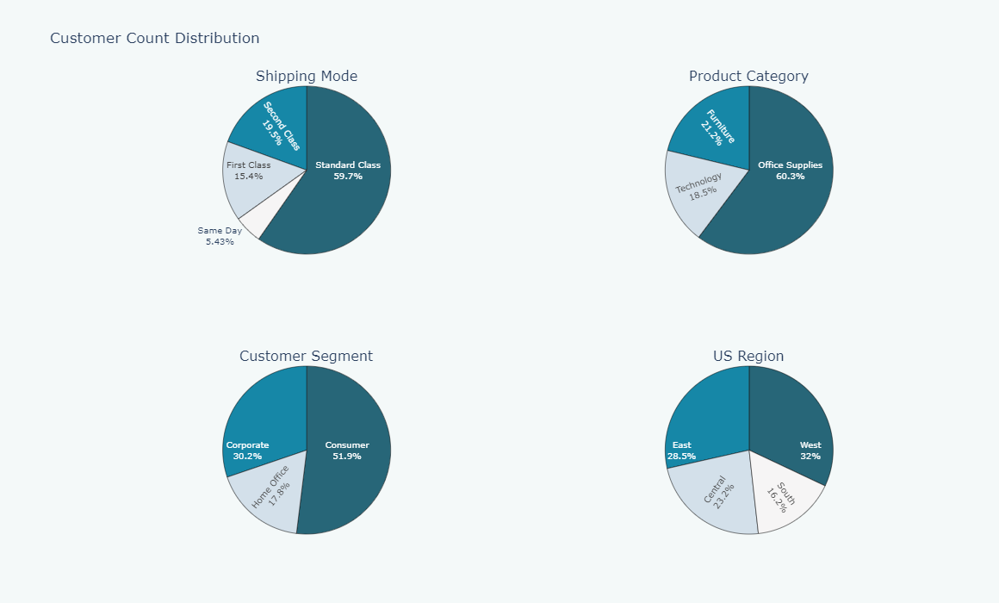

In [19]:
# Plotting pie charts for categorical data to see customer counts distibution

# Create subplots
fig = make_subplots(rows=2, cols=2,
                    specs=[[{'type':'domain'}, {'type':'domain'}], [{'type':'domain'}, {'type':'domain'}]],
                    subplot_titles=("Shipping Mode", "Product Category", "Customer Segment", "US Region"))

labels1 = df['Ship Mode'].value_counts().index
values1 = df['Ship Mode'].value_counts().values
fig.add_trace(go.Pie(labels=labels1, values=values1, name="Shipping Mode"),
             1, 1)

labels2 = df['Category'].value_counts().index
values2 = df['Category'].value_counts().values
fig.add_trace(go.Pie(labels=labels2, values=values2, name="Product Category"),
              1, 2)

labels3 = df['Segment'].value_counts().index
values3 = df['Segment'].value_counts().values
fig.add_trace(go.Pie(labels=labels3, values=values3, name="Customer Segment"),
              2, 1)

labels4 = df['Region'].value_counts().index
values4 = df['Region'].value_counts().values
fig.add_trace(go.Pie(labels=labels4, values=values4, name="Region"),
              2, 2)

fig.update_traces(textinfo = "label+percent",textfont_size=10,insidetextorientation='radial',
                  hoverinfo="label+percent",
                  marker=dict(colors=['276678', '1687a7', 'd3e0ea','f6f5f5'], 
                              line=dict(color='#000000', width=0.5))
                 )

fig.update_layout(height=700, width=700, 
                  autosize = False,
                  title_text='Customer Count Distribution',
                  showlegend=False, paper_bgcolor='#f4f9f9'
                 )
fig.show()

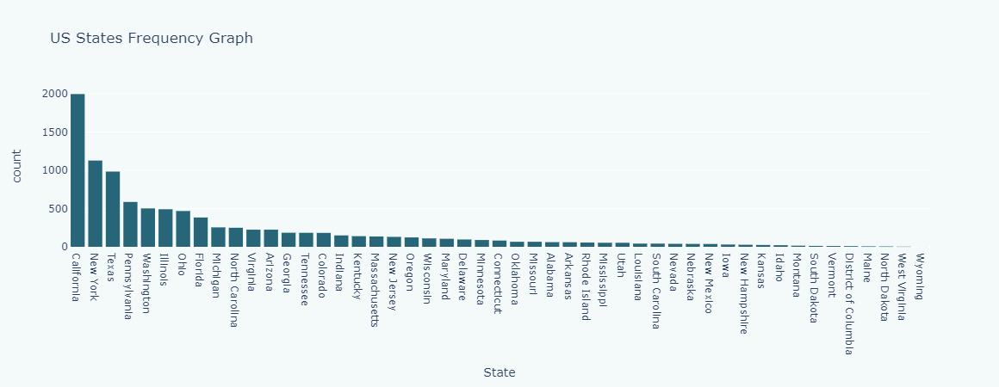

In [20]:
px.histogram(df, x='State',title='US States Frequency Graph'
            ).update_xaxes(categoryorder='total descending'
                          ).update_traces(marker={'color':'#276678'}).update_layout(paper_bgcolor='#f4f9f9', plot_bgcolor='rgba(0,0,0,0)')

In [21]:
# Getting statistical summary on numerical data
df[['Sales','Profit','Discount','Quantity']].describe()

,Sales,Profit,Discount,Quantity
count,9977.000000,9977.000000,9977.000000,9977.000000
mean,230.148881,28.690082,0.156278,3.790719
std,623.721412,234.457882,0.206455,2.226657
min,0.440000,-6599.980000,0.000000,1.000000
25%,17.300000,1.730000,0.000000,2.000000
50%,54.820000,8.670000,0.200000,3.000000
75%,209.970000,29.370000,0.200000,5.000000
max,22638.480000,8399.980000,0.800000,14.000000


In [22]:
df[['Sales','Profit','Quantity']].sum()

Sales       2296195.39
Profit       286240.95
Quantity      37820.00
dtype: float64

***
### <font color=blue>__A. Initial Observation__</font>:
***
#### Categorical Data Analysis
1. _Shipping Mode_: Most preferred choice of shipping mode is standard class while very few have opted for same day delivery.
2. _Customer Segment_: Majority of customers are individual consumers.
3. _Product Categories_: The data provides info on sales for three main categories of products of which office supplies have been sold most, next comes furniture and then technology products.
4. _Location_: The customers belong to four regins of US of which west contributes most and south region contributes the least.<br>
Among US states, majority of customers belong to California, New York, Texas while the store has least customer base in Wyoming, West Virginia, North Dakota etc.
***
#### Numerical Data Analysis
1. The data is about <u>9977 customers'transactions</u> of which the time frame for data collection is not provided.
2. The store has sold <u>total</u> of _37,820 units_ of products for _total sales of USD 2,296,195.6_ and _profit of USD 286,241.42_.
3. On an average a customer has purchased <u>3.79 units</u> ranging from minimum of 1 unit to maximum of 14 units.
4. The store has made an _average sales_ of <u>USD 230.14 per customer</u> with minimum sales of USD 0.44 and maximum sales of USD 22,638.48.
5. The store has made _maximum profit_ of USD 8,400 and experienced _maximum loss_ of USD 6,600 to a customer with _average profit_ of <u>USD 28.69 per customer</u>.
6. Average of <u>15% discount</u> with maximum 80% discount.
***

## 3. Overall Sales and Profit Distribution:

__Gross Profit Margin:__<br>
The gross margin is a financial ratio metric, which helps assess the profitability of a business and also its operational efficiency.<br>

It is the relationship between Gross Profit and sales, and it is expressed in percentage:<br>
> $(Gross Profit ÷ Sales) x 100 $


In [23]:
# Calculating Gross Profit Margin
df['Gross PM']=np.multiply(np.divide(df['Profit'],df['Sales']),100)

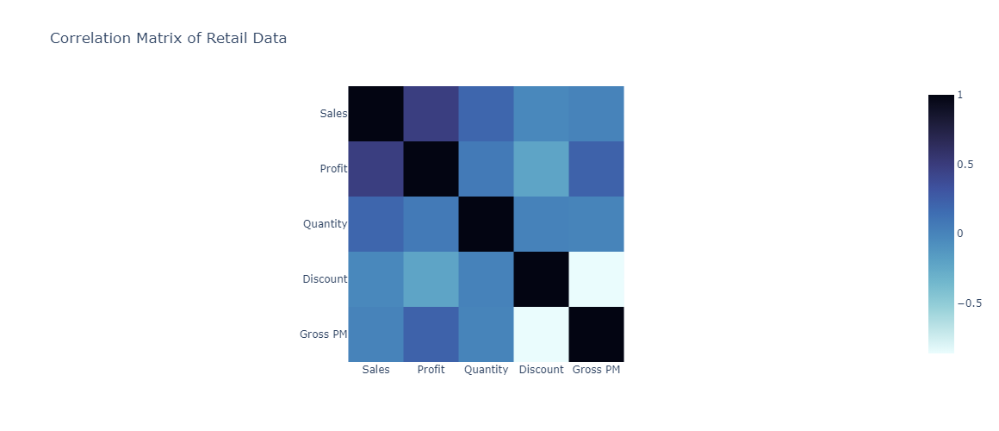

In [24]:
# Analysing correlation matrix for retail variables
px.imshow(df[['Sales','Profit','Quantity','Discount','Gross PM']].corr(), 
          title='Correlation Matrix of Retail Data',
          color_continuous_scale='ice_r').update_layout(height=500,width=500)

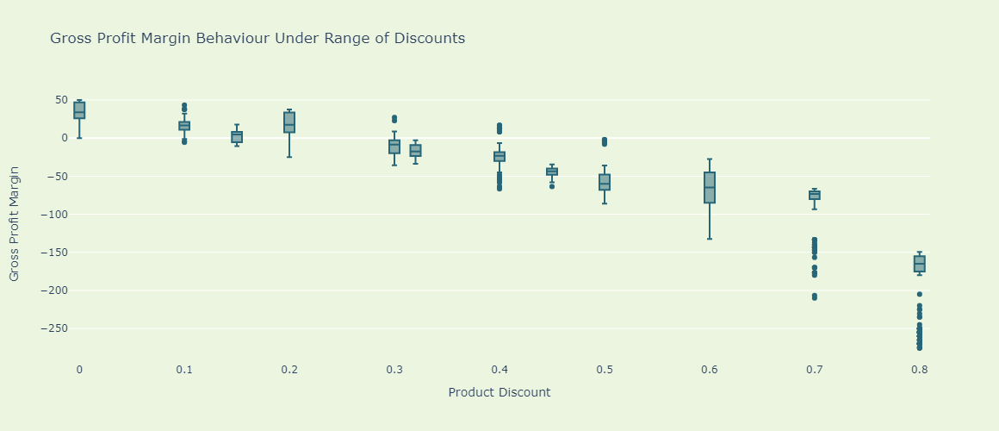

In [25]:
px.box(df, x='Discount', y='Gross PM',
       title='Gross Profit Margin Behaviour Under Range of Discounts',
       labels={'Discount':'Product Discount','Gross PM':'Gross Profit Margin'}
       ).update_traces(marker={'color':'#276678'} 
                      ).update_layout(height=500, width=900, plot_bgcolor='rgba(0,0,0,0)',paper_bgcolor='#EBF5DF')

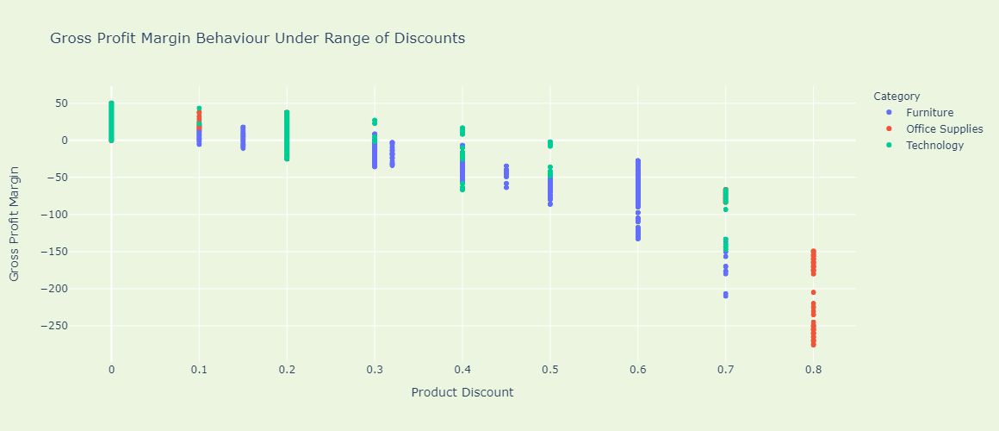

In [26]:
px.scatter(df, x='Discount', y='Gross PM',
           title='Gross Profit Margin Behaviour Under Range of Discounts',
           color='Category',
           labels={'Discount':'Product Discount','Gross PM':'Gross Profit Margin'}
          ).update_layout(height=500, width=900, paper_bgcolor='#EBF5DF', 
                                      plot_bgcolor='rgba(0,0,0,0)')

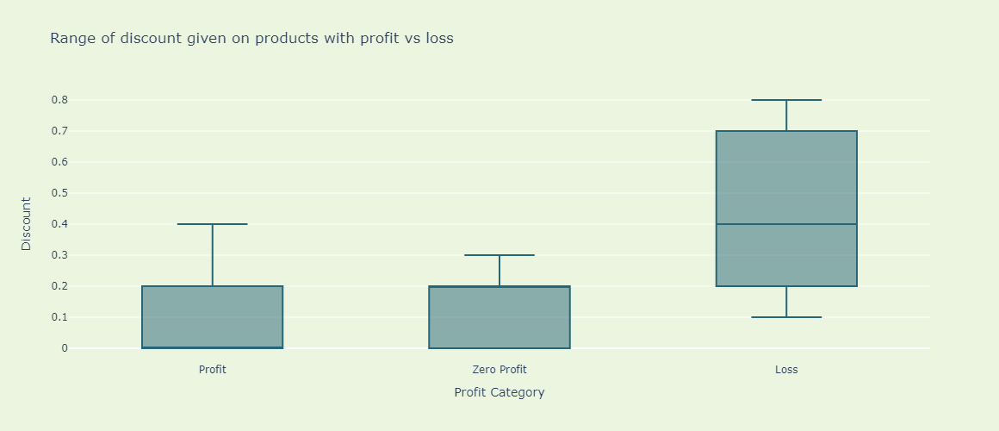

In [27]:
px.box(df, x='Profit Category', y='Discount',
       title='Range of discount given on products with profit vs loss',
       ).update_traces(marker={'color':'#276678'} 
                      ).update_layout(height=500, width=900, 
                                      plot_bgcolor='rgba(0,0,0,0)', paper_bgcolor='#EBF5DF')

***
### <font color=blue>__B. Overall profit insights__</font>:
***
1. Gross profit margin seem to be decreasing with increment in discount on products.
2. Beyond 40% discount, the store has experienced loss only.
2. Store has been able to make higher profit, with less than 20% discount, majority being without any discount.

## 4. Geographical sales:

### Region Analysis

In [28]:
# Plotting region wise sales and profit distribution
region = df.groupby(by='Region',as_index=False).agg({'Sales':'sum',
                                                         'Profit':'sum',
                                                        })
# Calculating Relative Profit
region['Gross PM']=np.multiply(np.divide(region['Profit'],region['Sales']),100)

region.sort_values('Gross PM', ascending=False, inplace=True, ignore_index=True)
region.head()

,Region,Sales,Profit,Gross PM
0,West,725255.57,108329.67,14.936758
1,East,678435.26,91506.03,13.487806
2,South,391721.83,46749.49,11.934359
3,Central,500782.73,39655.76,7.918756


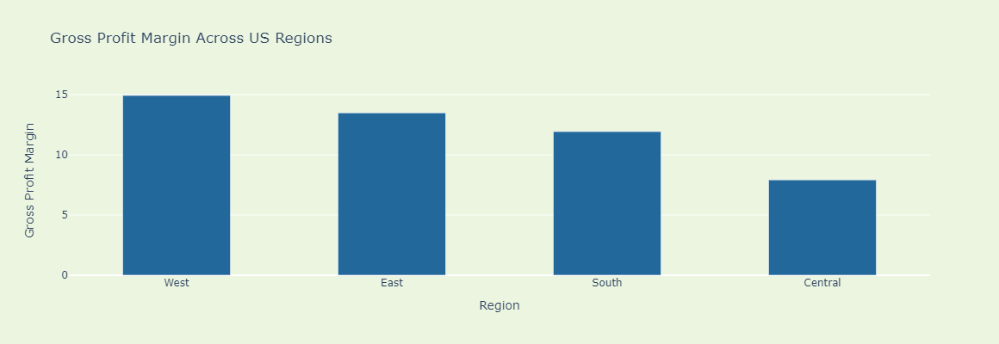

In [29]:
px.bar(region,x='Region',y='Gross PM', title='Gross Profit Margin Across US Regions',
       labels={'Gross PM':'Gross Profit Margin'}
      ).update_traces(marker={'color':'#23689b'}, width=0.5
                     ).update_layout(height=400,width=600,
                                     paper_bgcolor='#EBF5DF',plot_bgcolor='rgba(0,0,0,0)')

In [30]:
del region 
gc.collect()

55

### States Analysis

In [31]:
# Preparing dataset grouped by states

states=df.groupby(['State','state_code','Region'], as_index=False).agg({'Sales':'sum', 
                                                                        'Profit':'sum', 
                                                                        'Discount':['mean','min','max'],
                                                                        'Quantity':'sum'})
# Calculating Relative Profit
states['Gross PM']=np.multiply(np.divide(states['Profit'],states['Sales']),100)

states.columns = ['_'.join(col) if 'Discount' in col else col[0] for col in states.columns ]
states = states.sort_values('Sales',ascending=False,ignore_index=True)

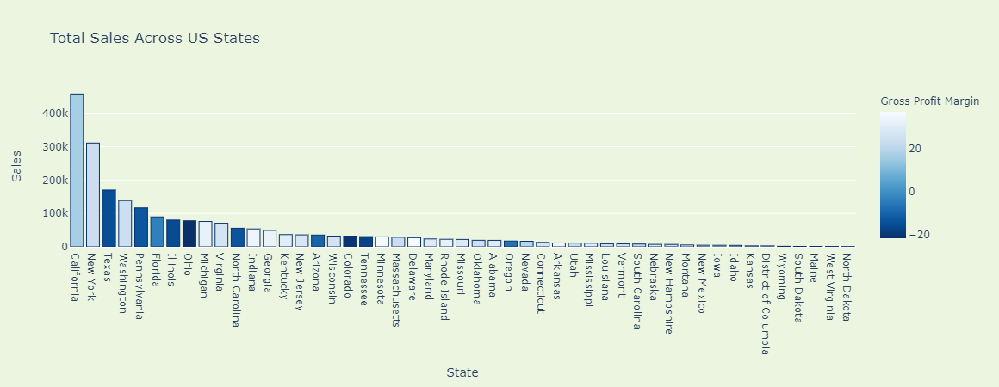

In [32]:
fig=px.bar(data_frame=states, x = 'State', y = 'Sales', 
           color='Gross PM', color_continuous_scale='blues_r',
           title = "Total Sales Across US States", labels={'Gross PM':'Gross Profit Margin'})
fig.update_traces(marker_line_color='rgb(8,48,107)',
                  marker_line_width=1)
fig.update_layout(paper_bgcolor='#EBF5DF', plot_bgcolor='rgba(0,0,0,0)')
fig.show()

Lets look at states with sales in lowest quartile:

In [33]:
states['Sales'].describe()

count        49.000000
mean      46861.130408
std       80751.781687
min         919.910000
25%        7464.930000
50%       22205.150000
75%       49095.840000
max      457576.260000
Name: Sales, dtype: float64

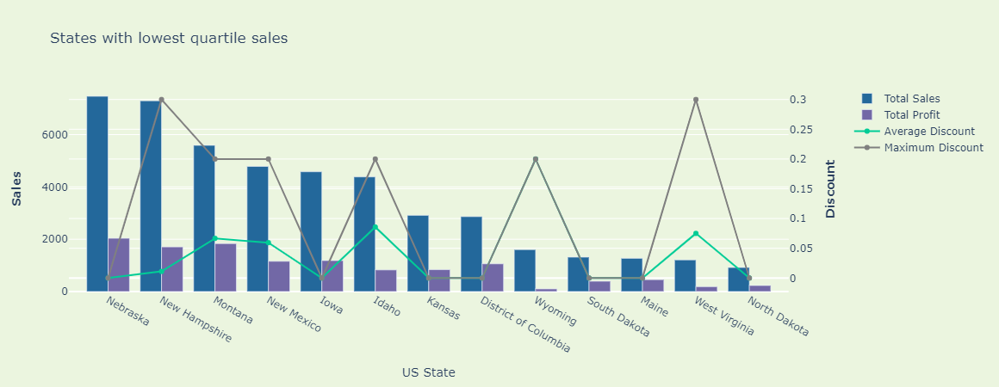

In [34]:
tail = states[states['Sales']<7464.93]

# Create figure with secondary y-axis
fig = make_subplots(specs=[[{"secondary_y": True}]])

# Add traces
fig.add_trace(
    go.Bar(x=tail['State'], y=tail['Sales'], name="Total Sales",marker={'color':'#23689b'}),
    secondary_y=False,
)
fig.add_trace(
    go.Bar(x=tail['State'], y=tail['Profit'], name="Total Profit",marker={'color':'#7268a6'}),
    secondary_y=False,
)

fig.add_trace(
    go.Scatter(x=tail['State'], y=tail['Discount_mean'], name="Average Discount"),
    secondary_y=True,
)

fig.add_trace(
    go.Scatter(x=tail['State'], y=tail['Discount_max'], name="Maximum Discount",marker={'color':'grey'}),
    secondary_y=True,
)

# Add figure title and set plot background color
fig.update_layout(
    title_text="States with lowest quartile sales",
    plot_bgcolor='rgba(0,0,0,0)',
    paper_bgcolor='#EBF5DF'
)

# Set x-axis title
fig.update_xaxes(title_text="US State")

# Set y-axes titles
fig.update_yaxes(title_text="<b>Sales</b>", secondary_y=False)
fig.update_yaxes(title_text="<b>Discount</b>", secondary_y=True)

fig.show()

States with lowest sales are not having any loss and the discounts on products seem to be in range from 0 to 30%.<br>
The store might benefit from more marketing and advertising in these states to increase sales and customer base.

Now, lets look at the profit across all states:

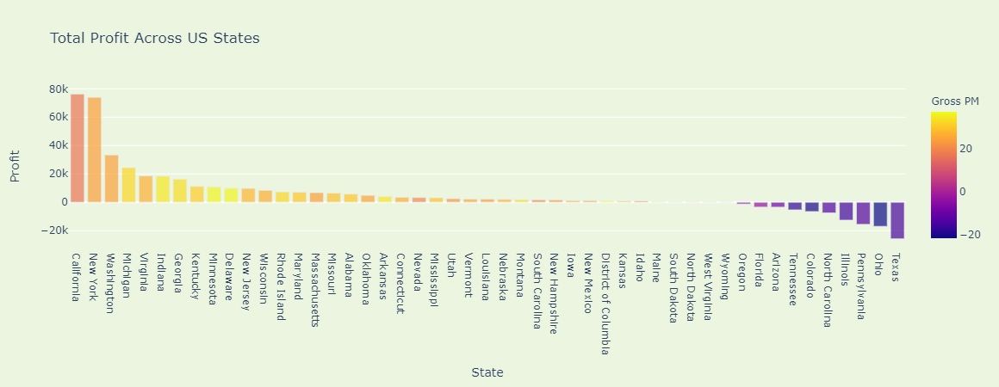

In [35]:
states = states.sort_values('Profit',ascending=False)
px.bar(data_frame=states, x = 'State', y = 'Profit', color='Gross PM',opacity = 0.7, 
           title = "Total Profit Across US States").update_layout(paper_bgcolor='#EBF5DF', plot_bgcolor='rgba(0,0,0,0)')

In [36]:
print('States (top 10) with highest profit:')
print(*list(states['State'][:10]),sep = ", ")
print('States incurring loss:')
print(*list(states[states['Profit']<0]['State']),sep = ", ")

States (top 10) with highest profit:
California, New York, Washington, Michigan, Virginia, Indiana, Georgia, Kentucky, Minnesota, Delaware
States incurring loss:
Oregon, Florida, Arizona, Tennessee, Colorado, North Carolina, Illinois, Pennsylvania, Ohio, Texas


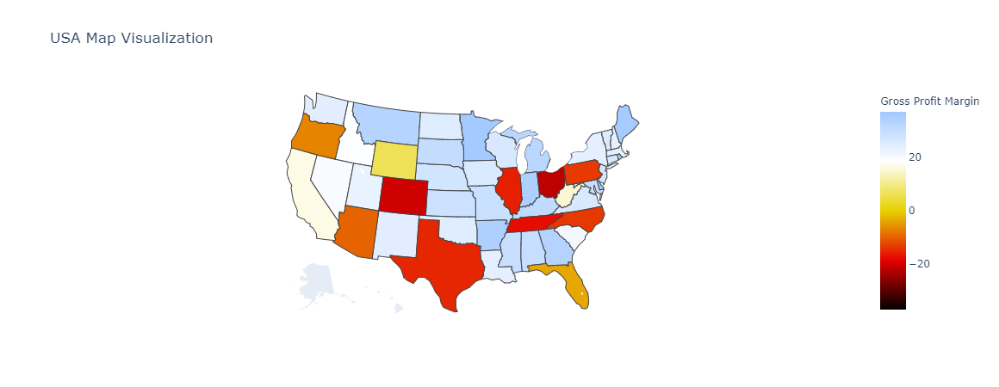

In [37]:
states['Sales']=round(states['Sales'])
fig_2=px.choropleth(data_frame=states,
                    locationmode ='USA-states',
                    locations='state_code',
                    scope='usa',
                    color='Gross PM',color_continuous_scale='blackbody',color_continuous_midpoint=0,
                    hover_name='State',
                    hover_data={'State':False,'Sales':True,'Discount_mean':True,'state_code':False, 'Region':True},
                    labels={'Gross PM':'Gross Profit Margin','Discount_mean':'Avg. Discount'},
#                     template='plotly_dark'
                    title='USA Map Visualization'
                   )
fig_2.show()

### Cities Analysis

In [38]:
cities = df.groupby(by=['State','City'], as_index=False).agg({'Latitude':'mean',
                                              'Longitude':'mean',
                                              'Discount':"mean",
                                              'Sales':'sum',
                                              'Profit':'sum'})
cities['Gross PM']=round(np.multiply(np.divide(cities['Profit'],cities['Sales']),100))


In [39]:
cities['Gross PM'].describe()

count    604.000000
mean      11.307947
std       32.936008
min     -271.000000
25%        3.000000
50%       19.500000
75%       30.000000
max       50.000000
Name: Gross PM, dtype: float64

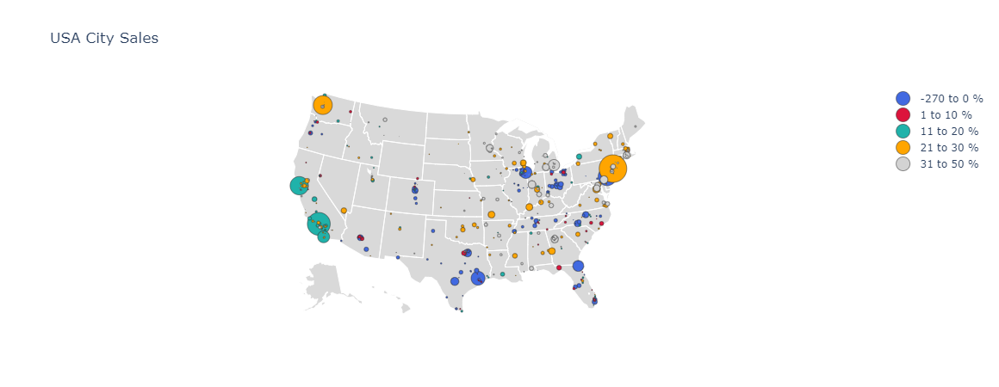

In [40]:
limits = [(-270,0),(1,10),(11,20),(21,30),(31,50)]
colors = ["royalblue","crimson","lightseagreen","orange","lightgrey"]
hover_data={'State':True,'Sales':True,'Profit':True,'Discount':True,'Latitude':False,'Longitude':False, 'Gross PM':False, "City":False}

fig = go.Figure()

for i in range(len(limits)):
    lim = limits[i]
    cities_ = cities[cities['Gross PM'].isin(range(lim[0],lim[1]))]
    fig.add_trace(go.Scattergeo(
        locationmode = 'USA-states',
        lon = cities_['Longitude'],
        lat = cities_['Latitude'],
        marker = dict(
            size = cities_['Sales'],
            color = colors[i],
            line_color='rgb(40,40,40)',
            line_width=0.5,
            sizemode = 'area',
            sizeref = 500,
            opacity =1,
        ),
        name = '{0} to {1} %'.format(lim[0],lim[1])))
    
fig.update_traces(hovertext=cities['City'],
                  hoverinfo='name+text')
    
fig.update_layout(
        title_text = 'USA City Sales',
        showlegend = True,
        geo = dict(
            scope = 'usa',
            landcolor = 'rgb(217, 217, 217)',
        )
    )

fig.show()

In [41]:
print('Cities with Profit in total:\t'+str(len(cities[cities['Profit']>=0]['City'].unique())))
print('Cities with Loss in total:\t'+str(len(cities[cities['Profit']<0]['City'].unique())))

Cities with Profit in total:	427
Cities with Loss in total:	134


In [42]:
cities=cities.sort_values('Profit', ascending=False, ignore_index=True)

#### Top 10 cities with highest gross profit margin

In [43]:
cities['City'][:10]

0    New York City
1      Los Angeles
2          Seattle
3    San Francisco
4          Detroit
5        Lafayette
6           Newark
7          Atlanta
8      Minneapolis
9        San Diego
Name: City, dtype: object

#### Top 10 cities with lowest gross profit margin (incurring highest loss)

In [44]:
cities['City'][-10:]

594    Jacksonville
595         Phoenix
596          Dallas
597      Louisville
598      Burlington
599         Chicago
600       Lancaster
601     San Antonio
602         Houston
603    Philadelphia
Name: City, dtype: object

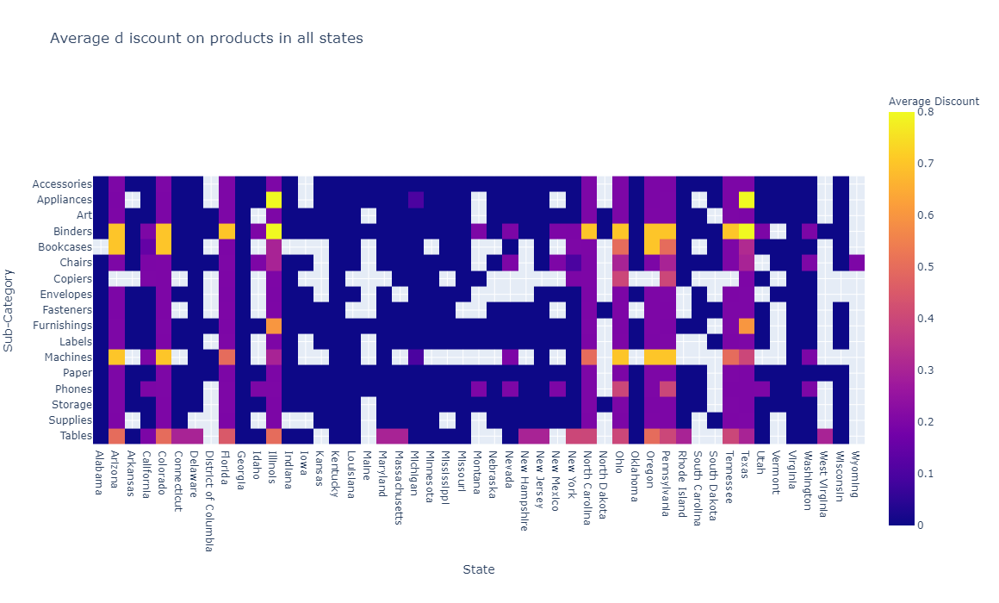

In [45]:
px.imshow(pd.crosstab(index=df['Sub-Category'],columns=df['State'],
                      values=df['Discount'],aggfunc=np.mean),
          labels={'color':'Average Discount'},
          title='Average d iscount on products in all states',
          height=700,width=1200)

In [46]:
loss_states=["Oregon", "Florida", "Arizona", "Tennessee", "Colorado", "North Carolina", "Illinois", "Pennsylvania", "Ohio", "Texas"]
loss_cities=cities[cities['Profit']<0]['City'].tolist()

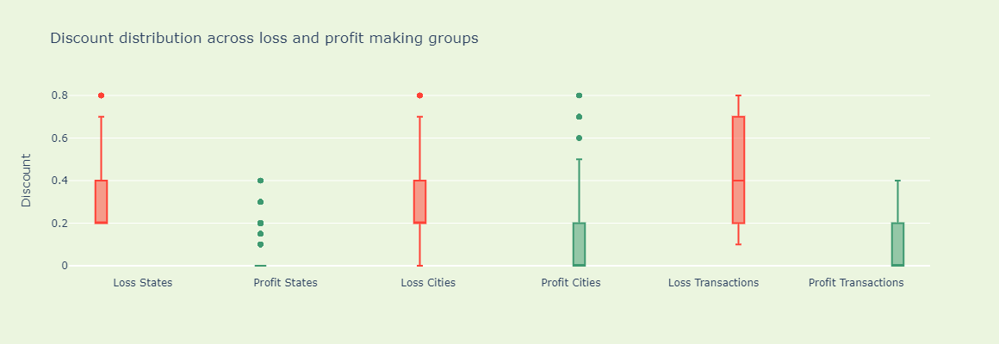

In [47]:
fig = go.Figure()

fig.add_trace(go.Box(
    y=df[df['State'].isin(loss_states)]['Discount'],
    name='Loss States',
    marker_color='#FF4136'
))

fig.add_trace(go.Box(
    y=df[~df['State'].isin(loss_states)]['Discount'],
    name='Profit States',
    marker_color='#3D9970'
))

fig.add_trace(go.Box(
    y=df[df['City'].isin(loss_cities)]['Discount'],
    name='Loss Cities',
    marker_color='#FF4136'
))

fig.add_trace(go.Box(
    y=df[~df['City'].isin(loss_cities)]['Discount'],
    name='Profit Cities',
    marker_color='#3D9970'
))
fig.add_trace(go.Box(
    y=df[df['Profit']<0]['Discount'],
    name='Loss Transactions',
    marker_color='#FF4136'
))

fig.add_trace(go.Box(
    y=df[df['Profit']>=0]['Discount'],
    name='Profit Transactions',
    marker_color='#3D9970'
))

fig.update_layout(
    title='Discount distribution across loss and profit making groups ',
    height=400, width=900,
    yaxis_title='Discount',
    boxmode='group',
    showlegend=False,
    plot_bgcolor='rgba(0,0,0,0)',
    paper_bgcolor='#EBF5DF'
)
fig.show()

***
### <font color=blue>__C. Location Insights__</font>:
***

1. The majority of sales for the store is observed in states of California, New York, Texas, Washington , Pennsylvania and so on.
2. States like Texas, Pennsylvania, Florida, Ohio have experienced loss despite the higher sales.
3. Gross profit margin is lowest in central region.
3. The data shows higher discount might have increased sales but at the cost of profit. The locations with discount more than 30% are incurring only loss.

## 5. Product Category Sales

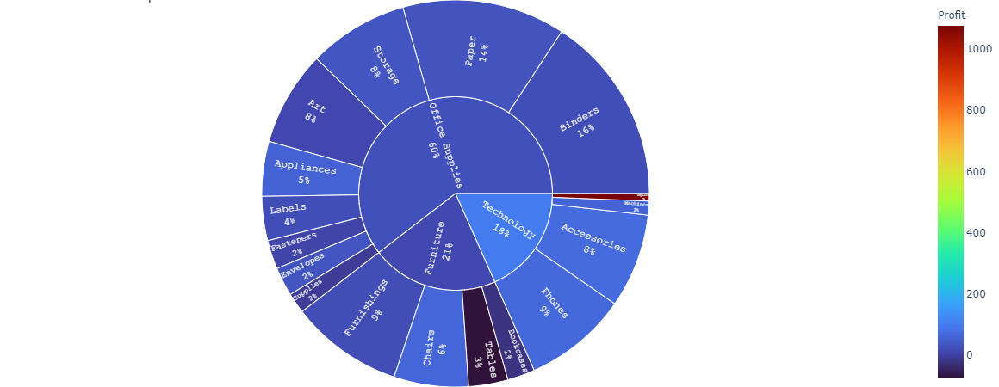

In [48]:
fig = px.sunburst(data_frame=df,
                  path = ['Category','Sub-Category'],
                  values='Quantity',
                  color='Profit',
                  color_continuous_scale='turbo',
#                   color_continuous_midpoint=0,
                  hover_name='Category',
                  hover_data={'Category':False},
                 )
fig.update_traces(textfont={'family':'Courier New'},
                  textinfo='label+percent entry',
                  insidetextorientation='radial')
fig.update_layout(title='Sunburst Graph',
                  margin=dict(t=0, l=0, r=0, b=0)
                 )

fig.show()

C:\Users\SAYALI\anaconda3\lib\site-packages\ipykernel_launcher.py:1: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.



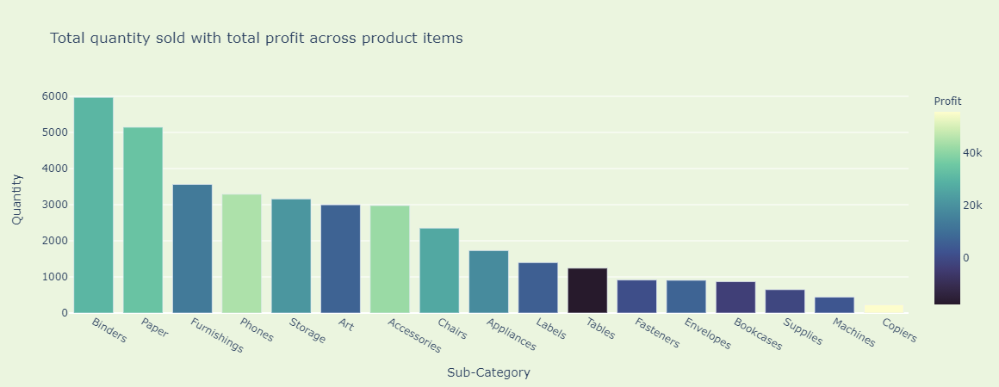

In [49]:
cat = df.groupby(by='Sub-Category',as_index=False)['Quantity','Sales','Profit'].sum().sort_values('Quantity',ascending=False)

px.bar(cat,x='Sub-Category',y='Quantity',
       title='Total quantity sold with total profit across product items',
       color='Profit', color_continuous_scale='deep_r' 
      ).update_layout(paper_bgcolor='#EBF5DF', plot_bgcolor='rgba(0,0,0,0)')

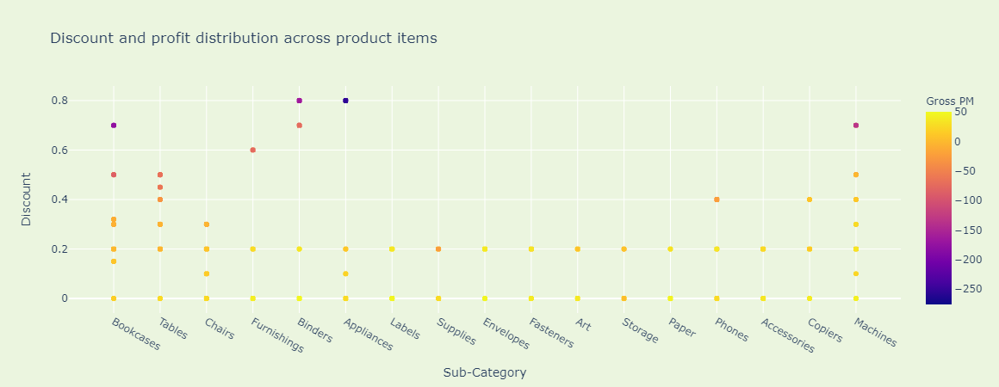

In [50]:
px.scatter(df.sort_values('Category'), x='Sub-Category', y='Discount', color='Gross PM', title='Discount and profit distribution across product items'
          ).update_layout(paper_bgcolor='#EBF5DF', plot_bgcolor='rgba(0,0,0,0)')

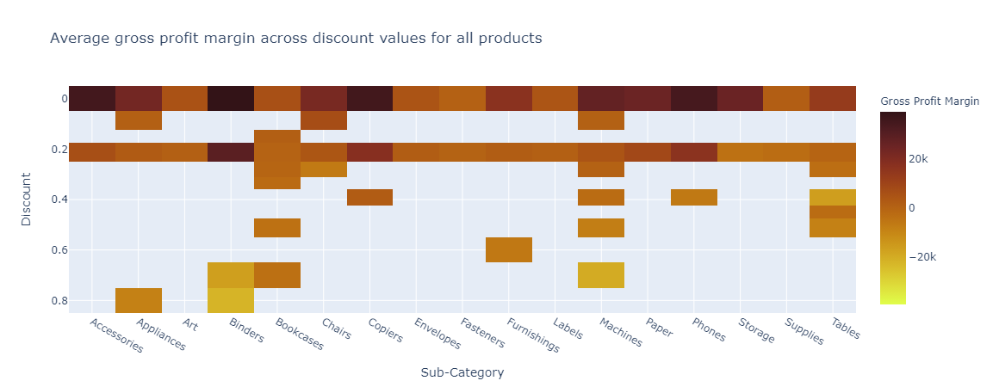

In [51]:
pro = pd.crosstab(index=df['Discount'],columns=df['Sub-Category'], values=df['Profit'],aggfunc=np.sum )
px.imshow(pro, color_continuous_scale='solar_r',color_continuous_midpoint=0,title='Average gross profit margin across discount values for all products',
         labels={'color':'Gross Profit Margin'})


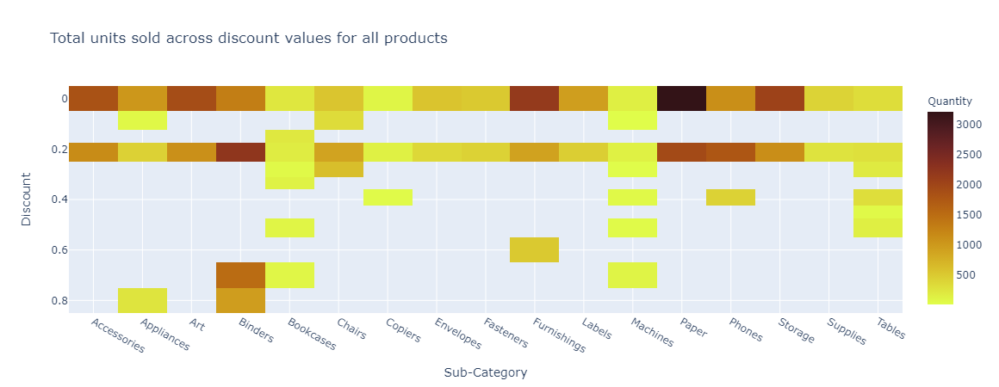

In [52]:
d = pd.crosstab(index=df['Discount'],columns=df['Sub-Category'], values=df['Quantity'],aggfunc=np.sum )
px.imshow(d, color_continuous_scale='solar_r',title='Total units sold across discount values for all products',
         labels={'color':'Quantity'})


***
### <font color=blue>__D. Product Category Insights__</font>
***
1. Technology product sales and profit are highest while furniture has made lowest profit. 
2. Tables, bookcases and supplies are incurring loss in sales.
3. Products when sold with higher discounts, more than 40%, have incurred loss only. 
4. Storage, accessories and supplies have shown profit without discount than with 20% discount.
5. Supermarket is making good profit from products when sold without discount.
6. The quantities sold are not increasing with increasing discount.
***
1. The majority of sales come from phones (technology), chairs (furniture), and storage products (office supplies) followed by tables, binders and machines.
2. The highest demand is seen for binders, paper, furnishings, phones, storage and so on.
3. Fasteners, machines, copiers, tables, supplies, bookcases are in less demand. With the exception of copiers all other products are being sold with lowest gross margin.
4. The highest gross profit making product is copiers, next to which comes binders. 
***

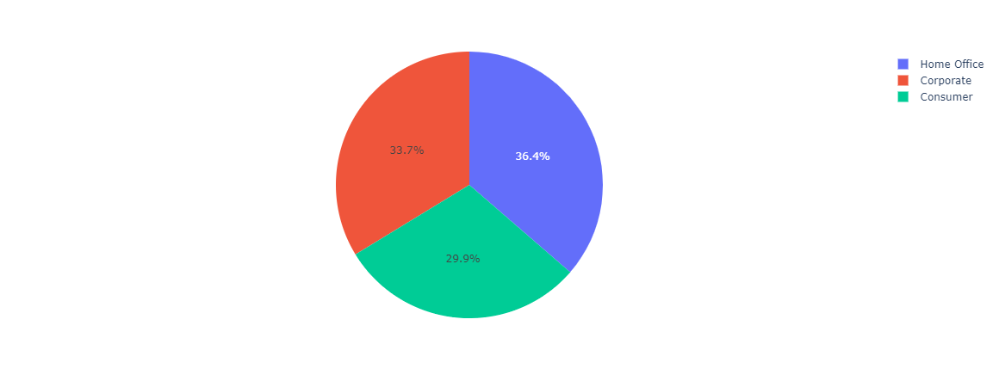

In [53]:
l= df.groupby(by=['Segment'],as_index=False).agg({'Sales':'sum', 'Profit':'sum', 'Discount':'mean'})
l['Gross PM']=np.multiply(np.divide(l['Profit'],l['Sales']),100)
px.pie(l,names='Segment',values='Gross PM').update_layout(showlegend=True)


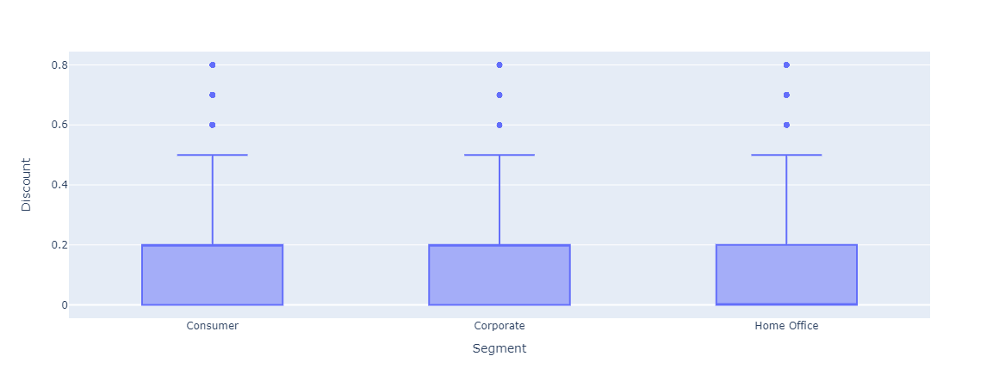

In [54]:
px.box(df, x='Segment',y='Discount')

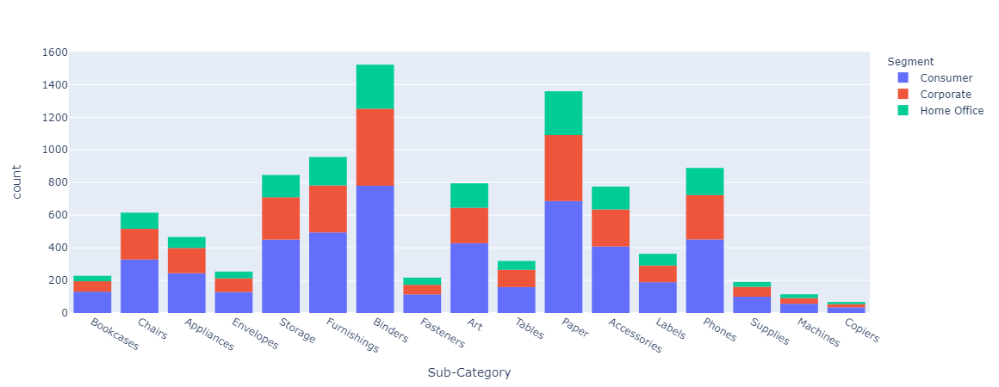

In [55]:
px.histogram(df, x='Sub-Category', color='Segment')

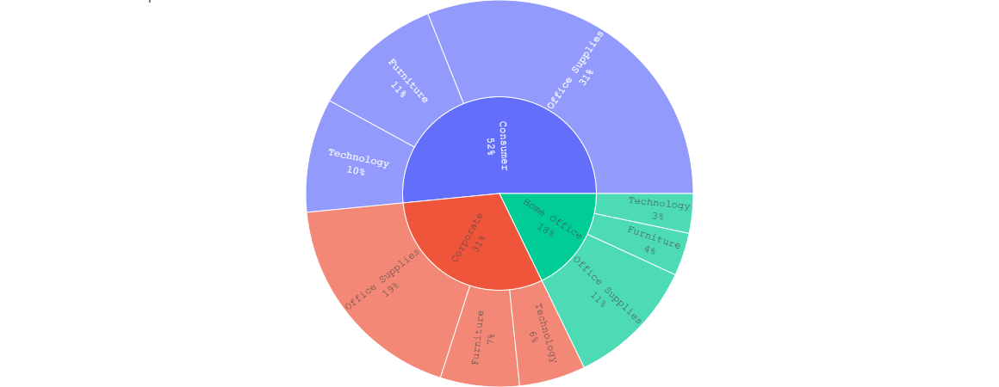

In [56]:
fig = px.sunburst(data_frame=df,
                  path = ['Segment','Category'],
                  values='Quantity',
                  hover_name='Segment',
                  hover_data={'Segment':False},
                 )
fig.update_traces(textfont={'family':'Courier New'},
                  textinfo='label+percent entry',
                  insidetextorientation='radial')
fig.update_layout(title='Sunburst Graph',
                  margin=dict(t=0, l=0, r=0, b=0)
                 )

fig.show()


## Conclusion:
***

The retail data for a superstore provides data for 9977 transactions across USA for selective product categories of technology, furniture and office supplies. As per the data, the store has sold 37,820 units of product items with revenue of USD 2,296,195.6 and gross profit of USD 286,241.42. For __USD 230.14 sales per transaction__, the store has gained __profit of USD 28.69 per transaction__. Majority of revenue comes from __technology__ products. Binders and paper are having highest demand while phones, chairs are having highest sale. Highest profit comes from copiers.

When the products and locations are analysed for profit, it is observed that the transactions have incurred loss when discounts of more than 40% have been applied on products. The gross profit margin is negatively correlated with the discount. States like Texas, Pennsylvaia, Florids despite having higher sales are bringing loss to the store.

Overall, products like tables, bookcases and supplies are not making profit in total and have been sold with higher discounts. With increasing discount, the quantities sold for a product item are not increasing, rather seem to be decreasing in most cases. The store has performed well when no discount or less than 20% discount is applied. The store might benefit by __reducing discount__ on loss making product items.

Additionally, __marketing and advertisement__ in regions with less customer base might help to increase the store presence, thereby increased sales.
***

#### Limitations:
1. The dataset lacks the timeframe for data collection which can provide more insights into the retail store sales.
2. The causation analysis can not be perofrmed.

#### Acknowledgement:
I would like to thank The Sparks Foundation community, my peers and mentors for support and guidance.

#### References:
1. Book: 'Retail Analytics: The revolution in consumer market.',Paul Odame and Gloria Jubi
2. You-Tube Channel: 'Charming Data' by Adam. https://www.youtube.com/channel/UCqBFsuAz41sqWcFjZkqmJqQ
***